# Preparation and testing of model specification

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from itertools import product
from pathlib import Path
from time import time

import aesara
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as gg
import pymc as pm
import pymc.sampling_jax
import seaborn as sns
from matplotlib.lines import Line2D

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/aesara/link/jax/dispatch.py:87: UserWarning: JAX omnistaging couldn't be disabled: Disabling of omnistaging is no longer supported in JAX version 0.2.12 and higher: see https://github.com/google/jax/blob/main/docs/design_notes/omnistaging.md.
/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/pymc/sampling_jax.py:36: UserWarning: This module is experimental.


In [3]:
from speclet.analysis.arviz_analysis import extract_coords_param_names
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel
from speclet.data_processing.common import head_tail
from speclet.io import DataFile, data_path
from speclet.loggers import set_console_handler_level
from speclet.managers.data_managers import CrisprScreenDataManager
from speclet.plot import set_speclet_theme
from speclet.project_configuration import arviz_config

In [4]:
# Logging.
set_console_handler_level("DEBUG")
aesara.config.exception_verbosity = "high"

# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
set_speclet_theme()
%config InlineBackend.figure_format = "retina"

# Constants
SEED = 847
np.random.seed(SEED)
arviz_config()

## Data

In [5]:
def _broad_only(df: pd.DataFrame) -> pd.DataFrame:
    return df.query("screen == 'broad'").reset_index(drop=True)

In [6]:
crispr_data_manager = CrisprScreenDataManager(
    DataFile.DEPMAP_CRC_SUBSAMPLE, transformations=[_broad_only]
)
crc_data = crispr_data_manager.get_data()

In [7]:
for col in ["sgrna", "hugo_symbol", "depmap_id"]:
    print(f"'{col}': {crc_data[col].nunique()}")

'sgrna': 162
'hugo_symbol': 103
'depmap_id': 8


## Distributions

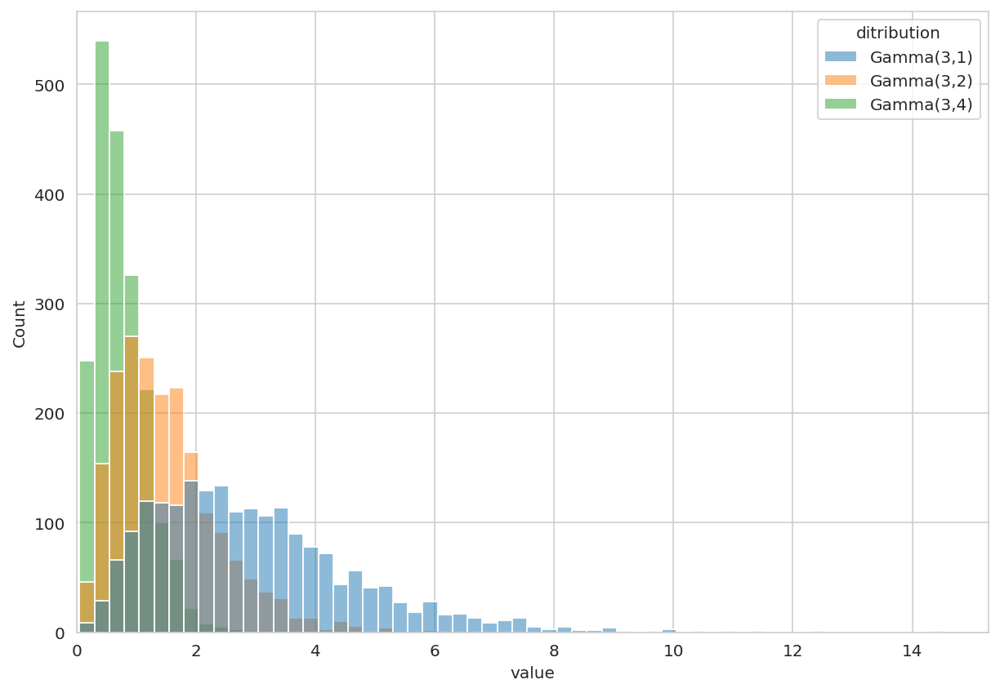

In [8]:
N = 2000
df = pd.DataFrame()
df = pd.concat(
    [
        df,
        # pd.DataFrame({"value": pm.draw(pm.HalfNormal.dist(0.5), N), "dist": "HN(0.5)"}),
        # pd.DataFrame({"value": pm.draw(pm.Exponential.dist(2), N), "dist": "Exp(2)"}),
        # pd.DataFrame({"value": pm.draw(pm.Exponential.dist(1), N), "dist": "Exp(1)"}),
        # pd.DataFrame(
        #     {"value": pm.draw(pm.Exponential.dist(0.2), N), "dist": "Exp(0.5)"}
        # ),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(2, 1), N), "dist": "Gamma(2,1)"}),
        pd.DataFrame({"value": pm.draw(pm.Gamma.dist(3, 1), N), "dist": "Gamma(3,1)"}),
        pd.DataFrame({"value": pm.draw(pm.Gamma.dist(3, 2), N), "dist": "Gamma(3,2)"}),
        pd.DataFrame({"value": pm.draw(pm.Gamma.dist(3, 4), N), "dist": "Gamma(3,4)"}),
        # pd.DataFrame({"value": pm.draw(pm.Gamma.dist(5, 1), N), "dist": "Gamma(5,1)"}),
        # pd.DataFrame(
        #     {"value": pm.draw(pm.Gamma.dist(10, 1), N), "dist": "Gamma(10,1)"}
        # ),
    ]
).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(10, 7))
sns.histplot(data=df, x="value", hue="dist", ax=ax, binwidth=0.25)
ax.get_legend().set_title("ditribution")
ax.set_xlim(0, None)
plt.show()

In [9]:
df.groupby("dist").describe()

value                                                    \
             count      mean       std       min       25%       50%   
dist                                                                   
Gamma(3,1)  2000.0  2.956380  1.716621  0.125304  1.695867  2.657682   
Gamma(3,2)  2000.0  1.505507  0.877052  0.054329  0.853332  1.343429   
Gamma(3,4)  2000.0  0.738708  0.424660  0.049298  0.426168  0.653983   

                                 
                 75%        max  
dist                             
Gamma(3,1)  3.873498  14.453774  
Gamma(3,2)  1.947066   6.023775  
Gamma(3,4)  0.985390   3.693832

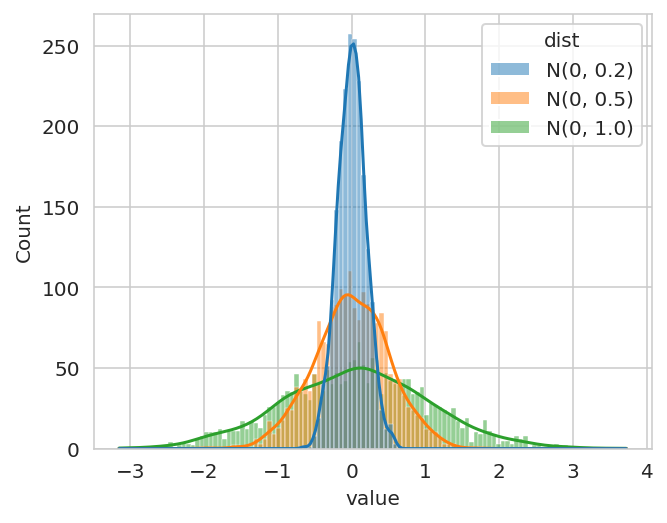

In [10]:
N = 2000
df = pd.concat(
    [
        pd.DataFrame(
            {"value": pm.draw(pm.Normal.dist(0, 0.2), N), "dist": "N(0, 0.2)"}
        ),
        pd.DataFrame(
            {"value": pm.draw(pm.Normal.dist(0, 0.5), N), "dist": "N(0, 0.5)"}
        ),
        pd.DataFrame({"value": pm.draw(pm.Normal.dist(0, 1), N), "dist": "N(0, 1.0)"}),
    ]
).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(5, 4))
sns.histplot(data=df, x="value", hue="dist", ax=ax, kde=True)
plt.show()

In [11]:
df.groupby("dist").describe()

value                                                              \
            count      mean       std       min       25%       50%       75%   
dist                                                                            
N(0, 0.2)  2000.0  0.004150  0.192746 -0.658716 -0.127837  0.003498  0.130352   
N(0, 0.5)  2000.0  0.003199  0.507288 -2.038923 -0.324153  0.004545  0.347458   
N(0, 1.0)  2000.0  0.061598  0.995963 -3.152209 -0.624480  0.076977  0.723108   

                     
                max  
dist                 
N(0, 0.2)  0.613701  
N(0, 0.5)  1.765408  
N(0, 1.0)  3.724946

(0.0, 99.75)

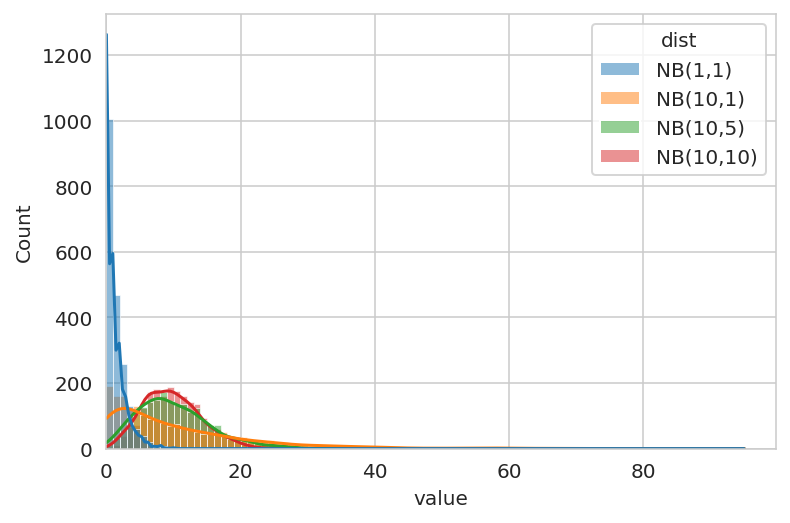

In [12]:
N = 2000
df = pd.DataFrame()
df = pd.concat(
    [
        df,
        pd.DataFrame(
            {"value": pm.draw(pm.NegativeBinomial.dist(1, 1), N), "dist": "NB(1,1)"}
        ),
        pd.DataFrame(
            {"value": pm.draw(pm.NegativeBinomial.dist(10, 1), N), "dist": "NB(10,1)"}
        ),
        pd.DataFrame(
            {"value": pm.draw(pm.NegativeBinomial.dist(10, 5), N), "dist": "NB(10,5)"}
        ),
        pd.DataFrame(
            {
                "value": pm.draw(pm.NegativeBinomial.dist(10, 10), N),
                "dist": "NB(10,10)",
            }
        ),
    ]
)
df = df.reset_index(drop=True)
ax = sns.histplot(data=df, x="value", hue="dist", kde=True, binwidth=1)
ax.set_xlim(0, None)

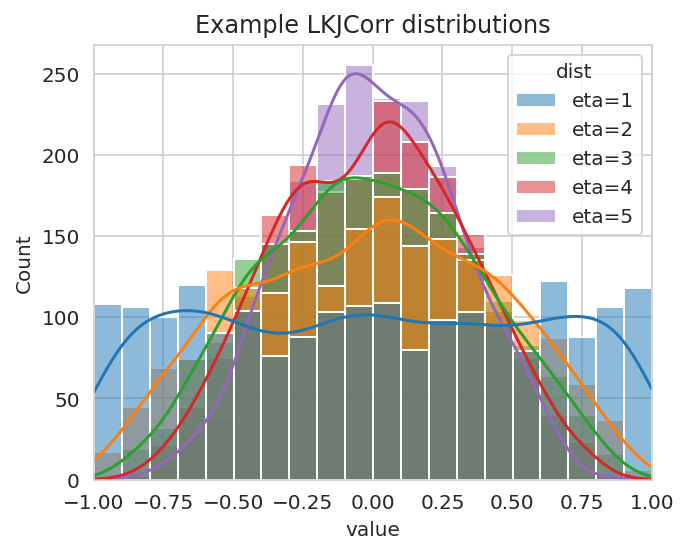

In [13]:
N = 2000


def _lkj(eta: int) -> pd.DataFrame:
    return pd.DataFrame(
        {
            "value": pm.draw(pm.LKJCorr.dist(n=2, eta=eta), N).flatten(),
            "dist": f"eta={eta}",
        }
    )


df = pd.concat([_lkj(i) for i in range(1, 6)]).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(5, 4))
sns.histplot(data=df, x="value", hue="dist", kde=True, binwidth=0.1, ax=ax)
ax.set_xlim(-1, 1)
ax.set_title("Example LKJCorr distributions")
plt.show()

In [14]:
df.groupby("dist").describe()

value                                                              \
        count      mean       std       min       25%       50%       75%   
dist                                                                        
eta=1  2000.0  0.001417  0.590413 -0.998538 -0.527013 -0.000029  0.513313   
eta=2  2000.0 -0.007614  0.442257 -0.995660 -0.355944  0.013149  0.338208   
eta=3  2000.0 -0.007539  0.380200 -0.914317 -0.294817 -0.005271  0.270489   
eta=4  2000.0 -0.001369  0.335098 -0.868730 -0.258395  0.013227  0.241202   
eta=5  2000.0  0.007362  0.296447 -0.813247 -0.203231  0.003967  0.223034   

                 
            max  
dist             
eta=1  0.999154  
eta=2  0.973688  
eta=3  0.903757  
eta=4  0.865329  
eta=5  0.834437

## Modeling

In [15]:
from speclet.bayesian_models.lineage_hierarchical_nb import LineageHierNegBinomModel

In [16]:
crc_model = LineageHierNegBinomModel(
    lineage="colorectal", reduce_deterministic_vars=False
)
valid_crc_data = crc_model.data_processing_pipeline(crc_data.copy())

[07/29/22 06:48:44] INFO     Processing data for modeling.     ]8;id=61473;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=448377;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#269\269]8;;\

                    INFO     LFC limits: (-5.0, 5.0)           ]8;id=516972;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=201237;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#270\270]8;;\

                    WARNING  number of data points dropped: 0  ]8;id=596421;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=666429;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#321\321]8;;\

                    INFO     Processing data for modeling.     ]8;id=354819;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=906553;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#269\269]8;;\

                    INFO     LFC limits: (-5.0, 5.0)           ]8;id=313576;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=721775;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#270\270]8;;\

[07/29/22 06:48:45] WARNING  number of data points dropped: 0  ]8;id=498671;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=843377;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#321\321]8;;\

                    INFO     number of genes mutated in all    ]8;id=582229;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=491386;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#470\470]8;;\
                             cells lines: 1                                                  

                    DEBUG    Genes always mutated: APC         ]8;id=580117;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=933377;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#473\473]8;;\

                    INFO     Dropping 2 cancer genes.          ]8;id=526309;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=566608;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#526\526]8;;\

                    DEBUG    Dropped cancer genes: ['APC',     ]8;id=748709;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=352587;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#527\527]8;;\
                             'MDM2']                                                         

                    INFO     Lineage: colorectal               ]8;id=487413;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=786948;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#325\325]8;;\

                    INFO     Number of genes: 103              ]8;id=970190;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=834247;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#326\326]8;;\

                    INFO     Number of sgRNA: 162              ]8;id=90110;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=976902;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#327\327]8;;\

                    INFO     Number of cell lines: 8           ]8;id=901934;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=983432;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#328\328]8;;\

                    INFO     Number of cancer genes: 3         ]8;id=999896;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=943230;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#329\329]8;;\

                    INFO     Number of screens: 1              ]8;id=860665;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=784798;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#330\330]8;;\

                    INFO     Number of data points: 1296       ]8;id=421023;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=796301;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#331\331]8;;\

                    INFO     Including all non-essential       ]8;id=221151;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=671641;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#336\336]8;;\
                             deterministic variables.                                        

                    DEBUG    shape of cancer gene matrix:      ]8;id=460481;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py\lineage_hierarchical_nb.py]8;;\:]8;id=853972;file:///n/data1/hms/dbmi/park/Cook/speclet/speclet/bayesian_models/lineage_hierarchical_nb.py#371\371]8;;\
                             (1296, 3)                                                       

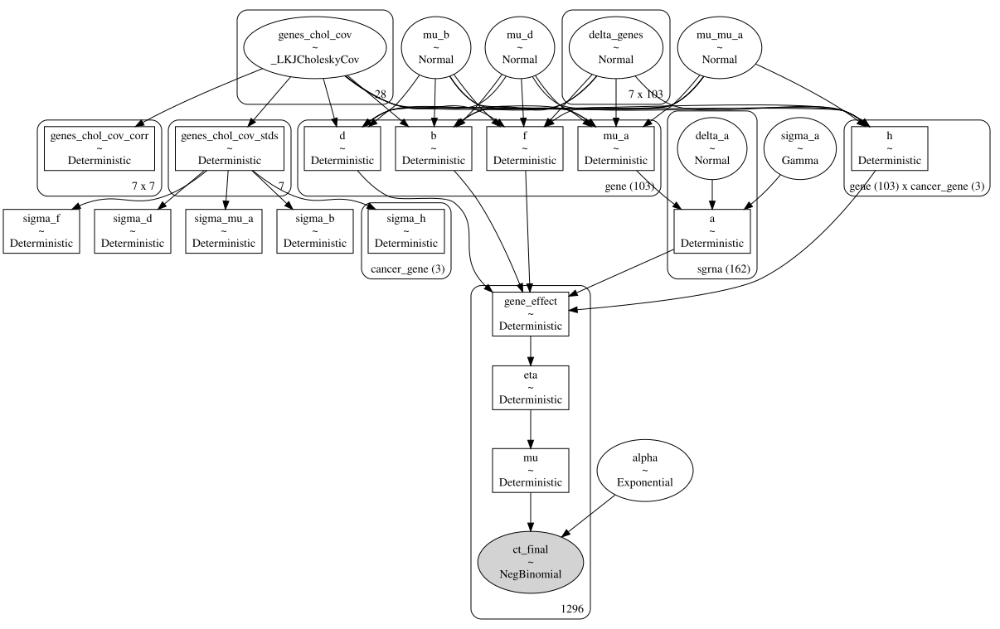

In [17]:
crc_pymc_model = crc_model.pymc_model(crispr_data_manager.data.copy())
pm.model_to_graphviz(crc_pymc_model)

In [18]:
with crc_pymc_model:
    pm_prior_pred = pm.sample_prior_predictive(
        var_names=["eta", "ct_final", "mu_a", "gene_effect"], random_seed=SEED
    )

print("prior predictive distribution")
pm_pred_draws = pm_prior_pred.prior_predictive["ct_final"].values.squeeze()
for q in [0, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99, 1]:
    res = np.quantile(pm_pred_draws, q=q)
    print(f"  {int(q*100)}%: {int(res):0,d}")

print("")
obs = valid_crc_data["counts_final"].astype(int)
print(f"final counts\n  min: {np.min(obs):,d},  max: {np.max(obs):,d}")

obs = valid_crc_data["counts_initial_adj"].astype(int)
print(f"initial counts\n  min: {np.min(obs):,d},  max: {np.max(obs):,d}")

prior predictive distribution
  0%: 0
  1%: 0
  10%: 5
  20%: 31
  30%: 75
  40%: 145
  50%: 254
  60%: 430
  70%: 745
  80%: 1,402
  90%: 3,410
  99%: 40,142
  100%: 10,854,420,220

final counts
  min: 0,  max: 9,819
initial counts
  min: 57,  max: 4,741


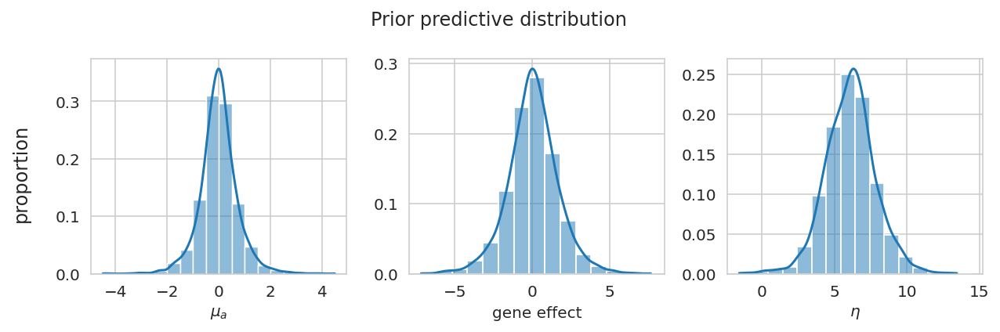

In [19]:
eta_prior = np.random.choice(pm_prior_pred.prior["eta"].values.flatten(), 2000)
ge_prior = np.random.choice(pm_prior_pred.prior["gene_effect"].values.flatten(), 4000)
mu_prior = np.random.choice(pm_prior_pred.prior["mu_a"].values.flatten(), 4000)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3))
sns.histplot(mu_prior, kde=True, ax=axes[0], binwidth=0.5, stat="proportion")
sns.histplot(ge_prior, kde=True, ax=axes[1], binwidth=1, stat="proportion")
sns.histplot(eta_prior, kde=True, ax=axes[2], binwidth=1, stat="proportion")
axes[0].set_xlabel(r"$\mu_a$")
axes[1].set_xlabel(r"gene effect")
axes[2].set_xlabel(r"$\eta$")

for ax in axes.flatten():
    ax.set_ylabel(None)
    ax.set_title(None)

fig.supylabel("proportion")
fig.suptitle("Prior predictive distribution")
fig.tight_layout()
plt.show()

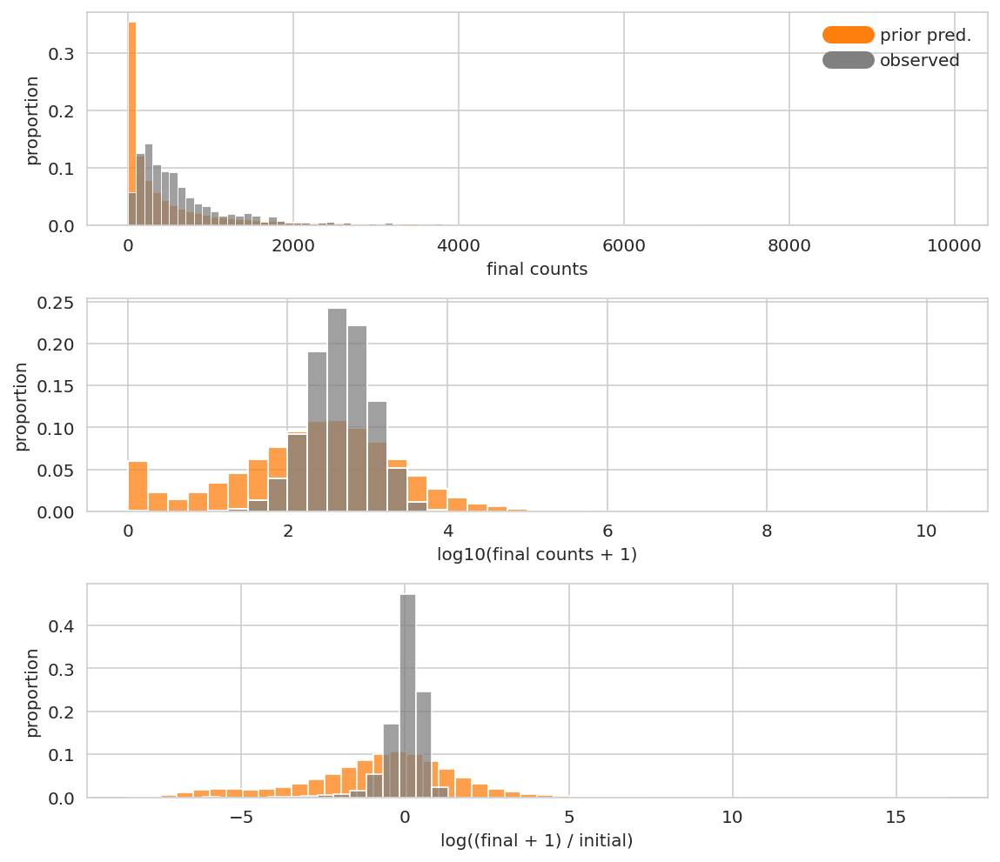

In [20]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 7))

stat = "proportion"

obs_max = crc_data["counts_final"].max()
truncated_prior_preds = [x for x in pm_pred_draws.flatten() if x <= obs_max]

prior_pred_pal = {"prior pred.": "tab:orange", "observed": "gray"}

# Untransformed
bw: float = 100
sns.histplot(
    x=truncated_prior_preds,
    ax=axes[0],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["prior pred."],
)
sns.histplot(
    x=valid_crc_data["counts_final"],
    ax=axes[0],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["observed"],
)
# Log10 transformed
bw = 0.25
sns.histplot(
    x=np.log10(pm_pred_draws.flatten() + 1),
    ax=axes[1],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["prior pred."],
)
sns.histplot(
    x=np.log10(valid_crc_data["counts_final"] + 1),
    ax=axes[1],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["observed"],
)
# Log-fold change
pp_lfc = np.log(
    (pm_pred_draws + 1) / (valid_crc_data["counts_initial_adj"].values[None, :])
)
obs_lfc = np.log(
    (valid_crc_data["counts_final"] + 1) / valid_crc_data["counts_initial_adj"]
)
bw = 0.5
sns.histplot(
    x=pp_lfc.flatten(),
    ax=axes[2],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["prior pred."],
)
sns.histplot(
    x=obs_lfc,
    ax=axes[2],
    binwidth=bw,
    stat=stat,
    color=prior_pred_pal["observed"],
)


axes[0].set_xlabel("final counts")
axes[1].set_xlabel("log10(final counts + 1)")
axes[2].set_xlabel("log((final + 1) / initial)")

prior_pred_leg_handles = [
    Line2D([0], [0], linewidth=10, color=v, label=k) for k, v in prior_pred_pal.items()
]
axes[0].legend(handles=prior_pred_leg_handles, loc="upper right", frameon=False)

for ax in axes.flatten():
    ax.set_ylabel(stat)

plt.tight_layout()
plt.show()

## Sampling

In [21]:
_init_cov = np.random.uniform(0.5, 1.5, (7, 7))
_init_cov = np.tril(_init_cov).flatten()
_init_cov = _init_cov[_init_cov > 0.1]
# corrs = np.random.uniform(0.5, 1.5, size=20)
# np.fill_diagonal(_init_cov, corrs)
_init_cov

array([0.96415189, 1.29270268, 0.52593841, 1.34871511, 0.82444838,
       0.6193704 , 0.57488727, 0.84880338, 0.78607066, 1.34096922,
       0.68584869, 1.324559  , 1.04061826, 1.00725075, 0.58828679,
       1.19554487, 1.15735483, 0.96282663, 1.34023568, 1.30142651,
       0.93417086, 0.83285906, 1.35580722, 0.9779947 , 0.83106767,
       1.42645705, 0.53459422, 1.13566922])

In [23]:
with crc_pymc_model:
    # trace = pymc.sampling_jax.sample_numpyro_nuts(
    trace = pm.sample(
        draws=500,
        tune=500,
        target_accept=0.90,
        random_seed=SEED,
        idata_kwargs={"log_likelihood": False},
        discard_tuned_samples=False,
    )
    pm.sample_posterior_predictive(trace, extend_inferencedata=True, random_seed=SEED)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [genes_chol_cov, mu_mu_a, mu_b, mu_d, delta_genes, sigma_a, delta_a, alpha]


Sampling 4 chains for 500 tune and 500 draw iterations (2_000 + 2_000 draws total) took 164 seconds.


In [24]:
trace

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

Warmup iterations saved (warmup_*).

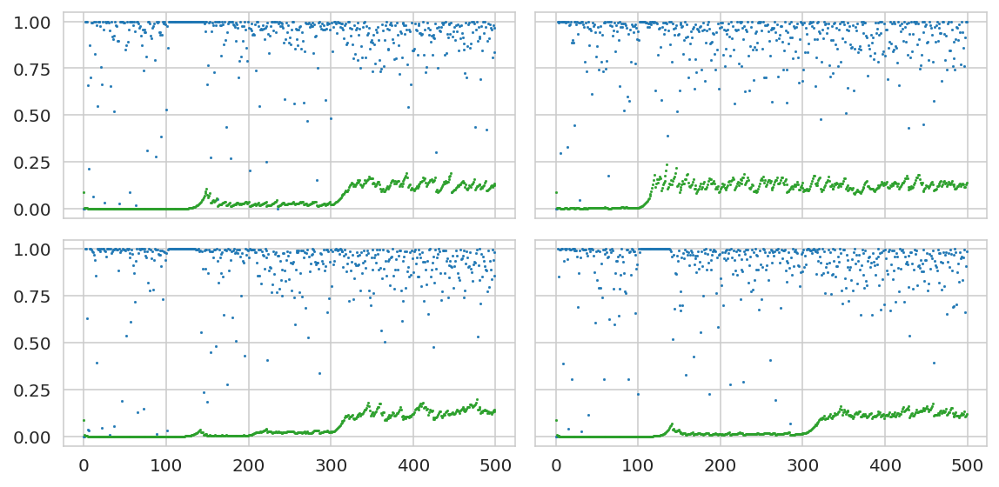

In [25]:
ar = trace.warmup_sample_stats.acceptance_rate.values
ss = trace.warmup_sample_stats.step_size.values
n_chains = ss.shape[0]
x = np.arange(ss.shape[1])
fig, axes = plt.subplots(n_chains // 2, 2, figsize=(8, 4), sharex=True, sharey=True)
for c, ax in enumerate(axes.flatten()):
    sns.scatterplot(x=x, y=ar[c, :], color="tab:blue", edgecolor=None, s=2, ax=ax)
    sns.scatterplot(x=x, y=ss[c, :], color="tab:green", edgecolor=None, s=2, ax=ax)

fig.tight_layout()
plt.show()

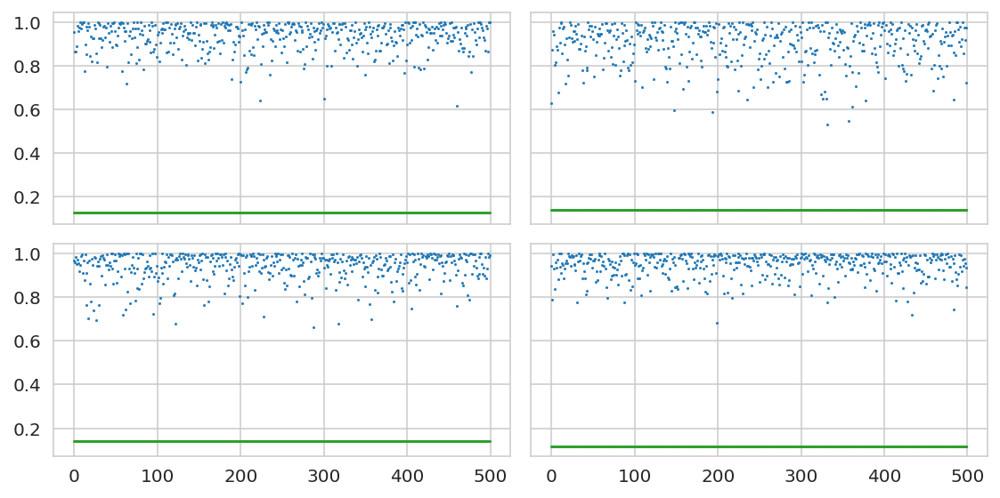

In [26]:
ar = trace.sample_stats.acceptance_rate.values
ss = trace.sample_stats.step_size.values
n_chains = ss.shape[0]
x = np.arange(ss.shape[1])
fig, axes = plt.subplots(n_chains // 2, 2, figsize=(8, 4), sharex=True, sharey=True)
for c, ax in enumerate(axes.flatten()):
    sns.scatterplot(x=x, y=ar[c, :], color="tab:blue", edgecolor=None, s=2, ax=ax)
    sns.scatterplot(x=x, y=ss[c, :], color="tab:green", edgecolor=None, s=2, ax=ax)

fig.tight_layout()
plt.show()

## Posterior analysis

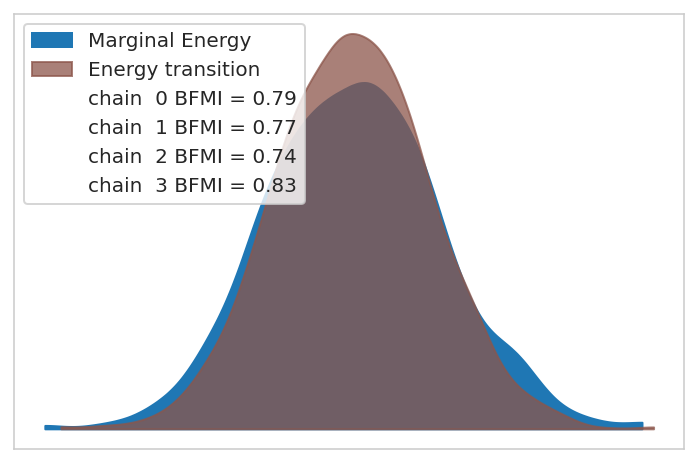

In [27]:
az.plot_energy(trace);

In [28]:
divs = trace.sample_stats["diverging"].values.sum(axis=1)
print(f"divergences: {divs}")

divergences: [0 0 0 0]


In [29]:
for stat in ["energy", "step_size", "acceptance_rate"]:
    avgs = trace.sample_stats[stat].values.mean(axis=1)
    print(f"{stat}: {avgs}")

energy: [10164.64480625 10173.0828674  10169.38451127 10167.59248682]
step_size: [0.12681489 0.14160516 0.14152576 0.1177268 ]
acceptance_rate: [0.9327368  0.8989993  0.93670376 0.94588394]


In [30]:
trace.warmup_posterior

<xarray.Dataset>
Dimensions:                    (chain: 4, draw: 500, delta_genes_dim_0: 7,
                                delta_genes_dim_1: 103, sgrna: 162,
                                genes_chol_cov_dim_0: 28,
                                genes_chol_cov_corr_dim_0: 7,
                                genes_chol_cov_corr_dim_1: 7,
                                genes_chol_cov_stds_dim_0: 7, cancer_gene: 3,
                                gene: 103, gene_effect_dim_0: 1296,
                                eta_dim_0: 1296, mu_dim_0: 1296)
Coordinates: (12/14)
  * chain                      (chain) int64 0 1 2 3
  * draw                       (draw) int64 0 1 2 3 4 5 ... 495 496 497 498 499
  * delta_genes_dim_0          (delta_genes_dim_0) int64 0 1 2 3 4 5 6
  * delta_genes_dim_1          (delta_genes_dim_1) int64 0 1 2 3 ... 100 101 102
  * sgrna                      (sgrna) <U20 'AAATAATTAAGTATGCACAT' ... 'TTTGG...
  * genes_chol_cov_dim_0       (genes_chol_cov_dim_0) int64 0 1 2 3 ... 25 26 27
    ...                         ...
  * genes_chol_cov_stds_dim_0  (genes_chol_cov_stds_dim_0) int64 0 1 2 3 4 5 6
  * cancer_gene                (cancer_gene) <U6 'FBXW7' 'KRAS' 'PIK3CA'
  * gene                       (gene) <U9 'ADH1B' 'ADH5' ... 'ZNF428' 'ZNF620'
  * gene_effect_dim_0          (gene_effect_dim_0) int64 0 1 2 ... 1294 1295
  * eta_dim_0                  (eta_dim_0) int64 0 1 2 3 ... 1292 1293 1294 1295
  * mu_dim_0                   (mu_dim_0) int64 0 1 2 3 ... 1292 1293 1294 1295
Data variables: (12/24)
    mu_mu_a                    (chain, draw) float64 -0.7092 -0.7092 ... 0.08766
    mu_b                       (chain, draw) float64 -0.6569 ... -0.01284
    mu_d                       (chain, draw) float64 -0.009375 ... -0.04931
    delta_genes                (chain, draw, delta_genes_dim_0, delta_genes_dim_1) float64 ...
    delta_a                    (chain, draw, sgrna) float64 -0.4912 ... -1.188
    genes_chol_cov             (chain, draw, genes_chol_cov_dim_0) float64 0....
    ...                         ...
    f                          (chain, draw, gene) float64 -1.464 ... -0.1468
    h                          (chain, draw, gene, cancer_gene) float64 -1.44...
    a                          (chain, draw, sgrna) float64 -0.2597 ... -0.9566
    gene_effect                (chain, draw, gene_effect_dim_0) float64 -0.24...
    eta                        (chain, draw, eta_dim_0) float64 6.049 ... 5.192
    mu                         (chain, draw, mu_dim_0) float64 423.6 ... 179.9
Attributes:
    created_at:                 2022-07-29T10:52:23.255844
    arviz_version:              0.12.1
    inference_library:          pymc
    inference_library_version:  4.1.2
    sampling_time:              163.66693258285522
    tuning_steps:               500

In [31]:
trace.warmup_posterior["sigma_mu_a"].values[:, 0:5]

array([[9.57075846e-01, 9.57075846e-01, 8.30520045e-01, 7.60328292e-01,
        6.66563997e-01],
       [2.54663744e+00, 2.54663744e+00, 1.71071939e+00, 1.40629103e+00,
        2.40048411e-01],
       [1.13579865e+00, 1.13579865e+00, 1.13347287e+00, 3.19955306e-02,
        3.15872343e-02],
       [7.43605402e-01, 7.43605402e-01, 7.83138094e-01, 8.70449128e-04,
        8.72239151e-04]])

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/utils.py:136: UserWarning: Items starting with ~: ['^celllines_chol_cov.*$', '^.*celllines$'] have not been found and will be ignored


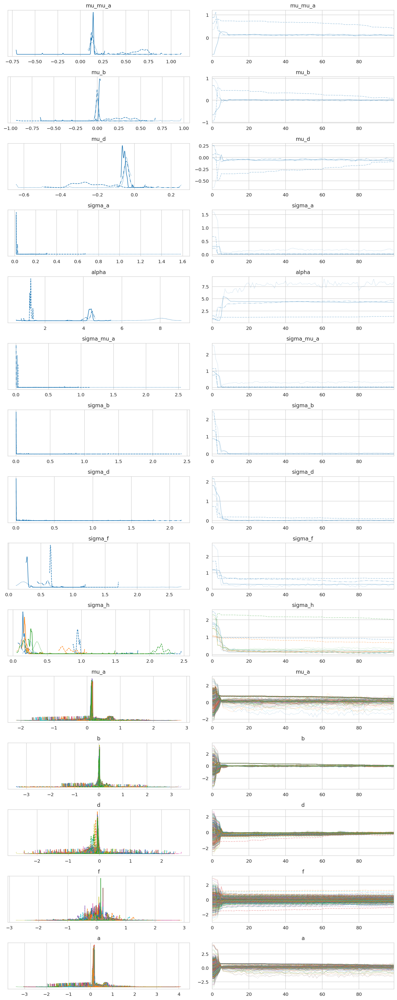

In [32]:
az.plot_trace(
    trace.warmup_posterior,
    var_names=crc_model.vars_regex() + ["~^h$"],
    filter_vars="regex",
    coords={"draw": list(range(100))},
)
plt.tight_layout();

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/utils.py:136: UserWarning: Items starting with ~: ['^celllines_chol_cov.*$', '^.*celllines$'] have not been found and will be ignored


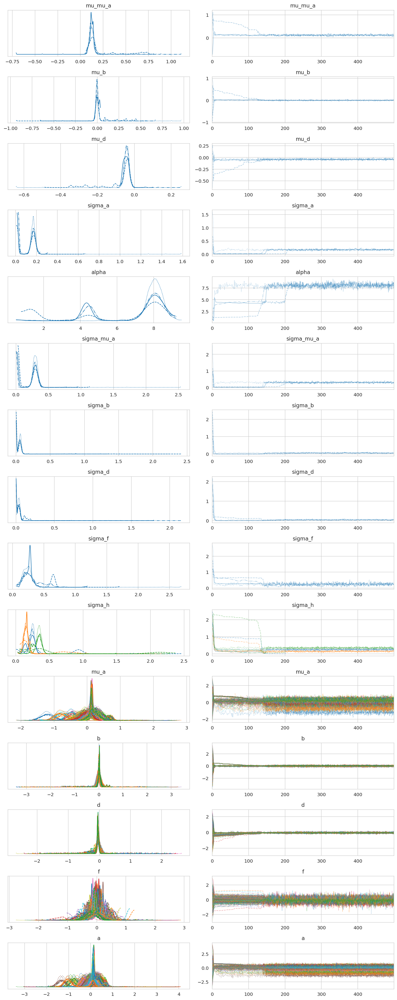

In [33]:
az.plot_trace(
    trace.warmup_posterior,
    var_names=crc_model.vars_regex() + ["~^h$"],
    filter_vars="regex",
)
plt.tight_layout();

/home/jc604/.conda/envs/speclet/lib/python3.10/site-packages/arviz/utils.py:136: UserWarning: Items starting with ~: ['^celllines_chol_cov.*$', '^.*celllines$'] have not been found and will be ignored


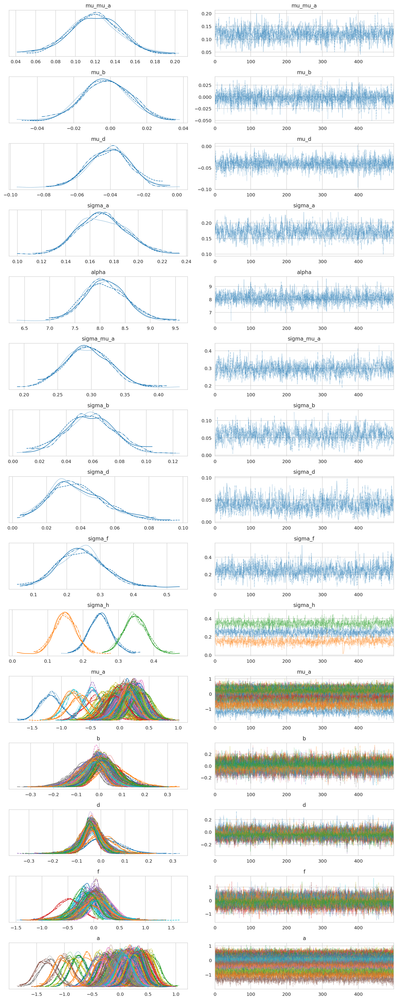

In [34]:
az.plot_trace(trace, var_names=crc_model.vars_regex() + ["~^h$"], filter_vars="regex")
plt.tight_layout();

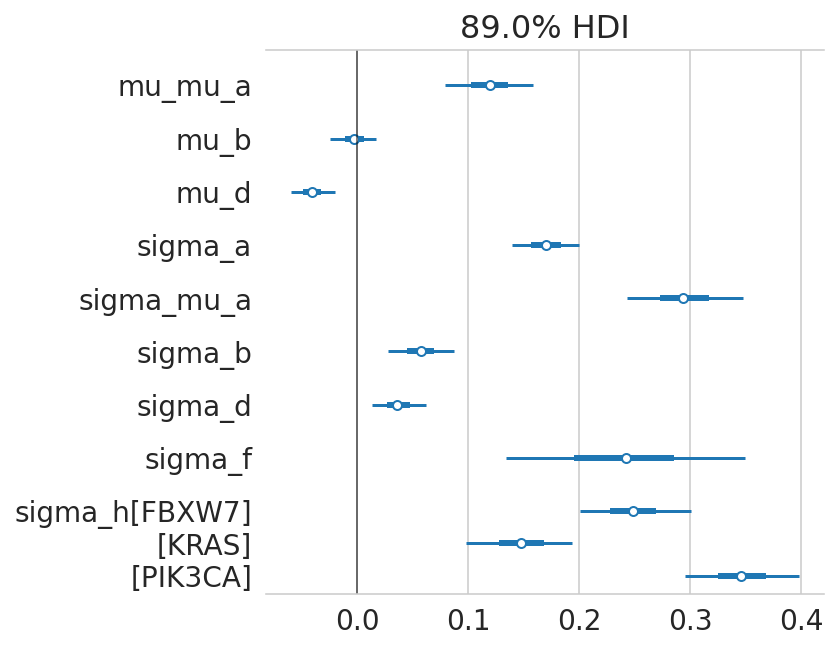

In [35]:
ax = az.plot_forest(
    trace,
    var_names=["mu_mu_a", "mu_b", "mu_d", "mu_f", "mu_h", "^sigma.*$"],
    filter_vars="regex",
    combined=True,
    figsize=(5, 5),
)
ax[0].axvline(color="k", alpha=0.5, linewidth=1)
plt.show()

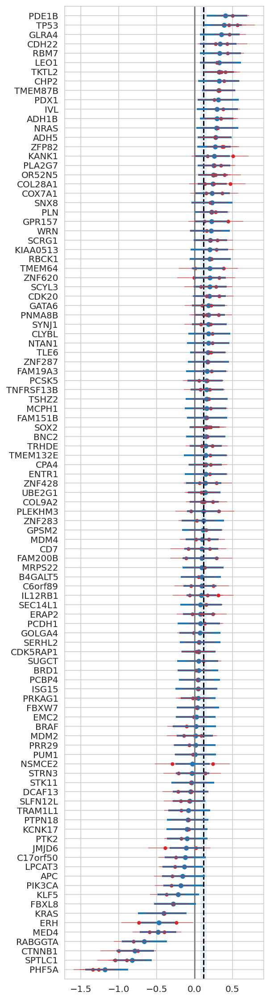

In [36]:
gene_order = (
    az.summary(trace, var_names=["mu_a"], kind="stats")
    .pipe(extract_coords_param_names, names=["hugo_symbol"])
    .sort_values("mean")["hugo_symbol"]
    .tolist()
)

sgrna_to_gene_map = (
    crc_data[["hugo_symbol", "sgrna"]].drop_duplicates().reset_index(drop=True)
)
a_post = (
    az.summary(trace, var_names=["a"], kind="stats")
    .pipe(extract_coords_param_names, names=["sgrna"])
    .reset_index(drop=True)
    .merge(sgrna_to_gene_map, on="sgrna", validate="one_to_one")
)
mu_a_post = (
    az.summary(trace, var_names=["mu_a"], kind="stats")
    .pipe(extract_coords_param_names, names=["hugo_symbol"])
    .reset_index(drop=True)
)

a_post["hugo_symbol"] = pd.Categorical(
    a_post["hugo_symbol"], categories=gene_order, ordered=True
)
a_post = a_post.sort_values("hugo_symbol").reset_index(drop=True)
mu_a_post["hugo_symbol"] = pd.Categorical(
    mu_a_post["hugo_symbol"], categories=gene_order, ordered=True
)
mu_a_post = mu_a_post.sort_values("hugo_symbol").reset_index(drop=True)

mu_mu_a_post = az.summary(trace, var_names=["mu_mu_a"], kind="stats")
assert len(mu_mu_a_post) == 1
mu_mu_a_avg = mu_mu_a_post["mean"][0]
mu_mu_a_hdi = (mu_mu_a_post["hdi_5.5%"][0], mu_mu_a_post["hdi_94.5%"][0])

fig, ax = plt.subplots(figsize=(4, 20))
plt.axvline(0, color="grey")

# Population average and HDI
plt.fill_between(x=mu_mu_a_hdi, y1=-1, y2=len(mu_a_post), alpha=0.1)
plt.axvline(mu_mu_a_avg, color="k", linestyle="--")

# Gene estimates.
plt.hlines(
    y=mu_a_post["hugo_symbol"],
    xmin=mu_a_post["hdi_5.5%"],
    xmax=mu_a_post["hdi_94.5%"],
    color="tab:blue",
    linewidth=2,
)
plt.scatter(x=mu_a_post["mean"], y=mu_a_post["hugo_symbol"], s=20, c="tab:blue")

# sgRNA estimates.
plt.hlines(
    y=a_post["hugo_symbol"],
    xmin=a_post["hdi_5.5%"],
    xmax=a_post["hdi_94.5%"],
    color="tab:red",
    linewidth=1,
    alpha=0.5,
)
plt.scatter(x=a_post["mean"], y=a_post["hugo_symbol"], s=10, c="tab:red")

plt.ylim(-1, len(mu_a_post))
plt.show()

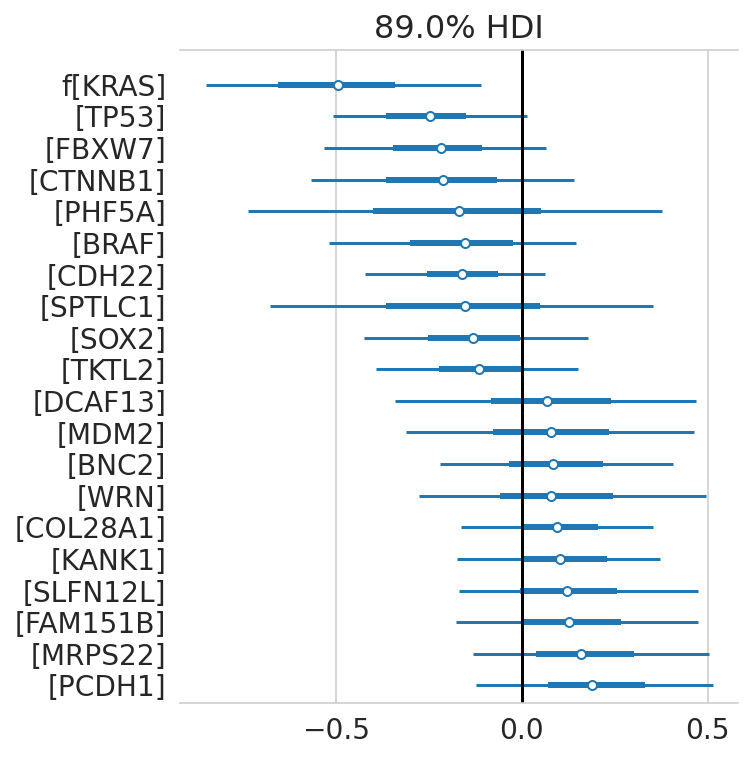

In [37]:
top_mut_effect_genes = (
    az.summary(trace, var_names=["f"])
    .sort_values("mean")
    .pipe(head_tail)
    .pipe(extract_coords_param_names, "hugo_symbol")["hugo_symbol"]
    .tolist()
)
ax = az.plot_forest(
    trace,
    var_names=["f"],
    coords={"gene": top_mut_effect_genes},
    combined=True,
    figsize=(5, 6),
)
ax[0].axvline(0, color="k")
plt.show()

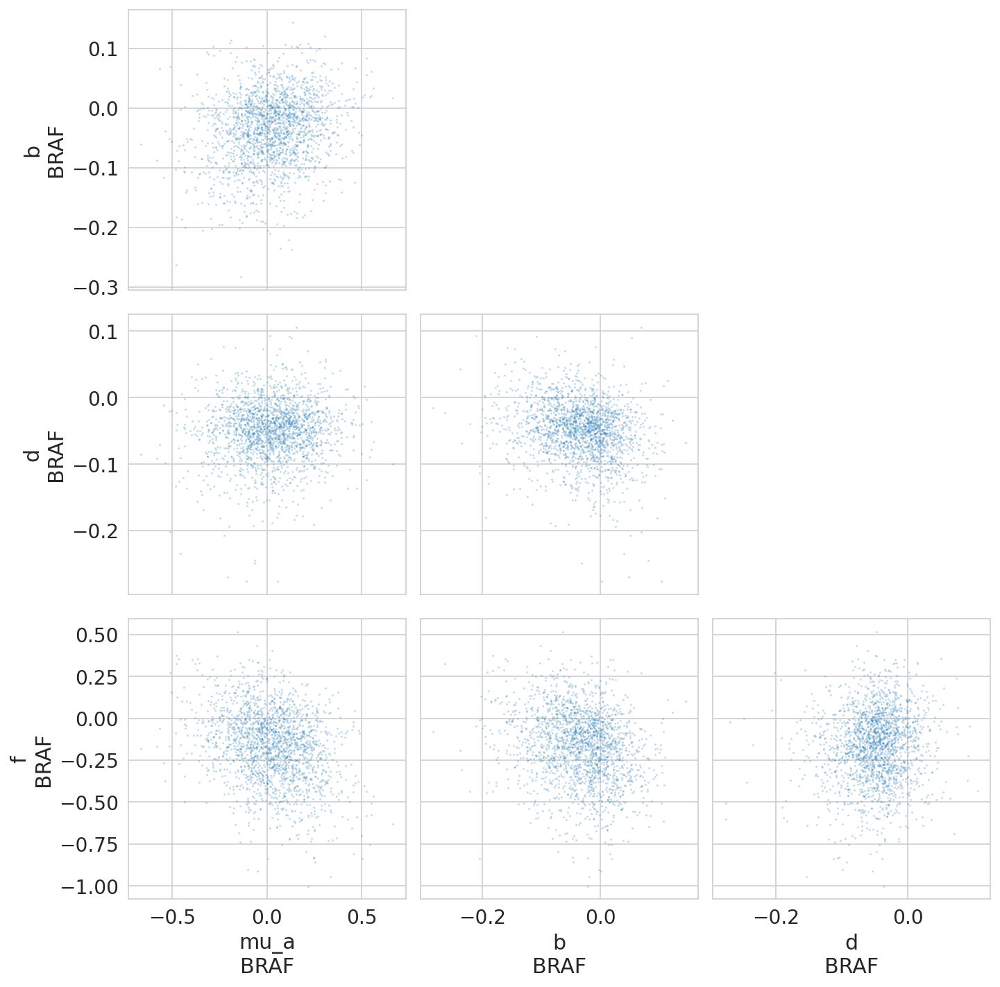

In [38]:
az.plot_pair(
    trace,
    var_names=["mu_a", "b", "d", "f"],
    coords={"gene": ["BRAF"]},
    scatter_kwargs={"alpha": 0.25, "markersize": 1},
    figsize=(10, 10),
)
plt.tight_layout()
plt.show()

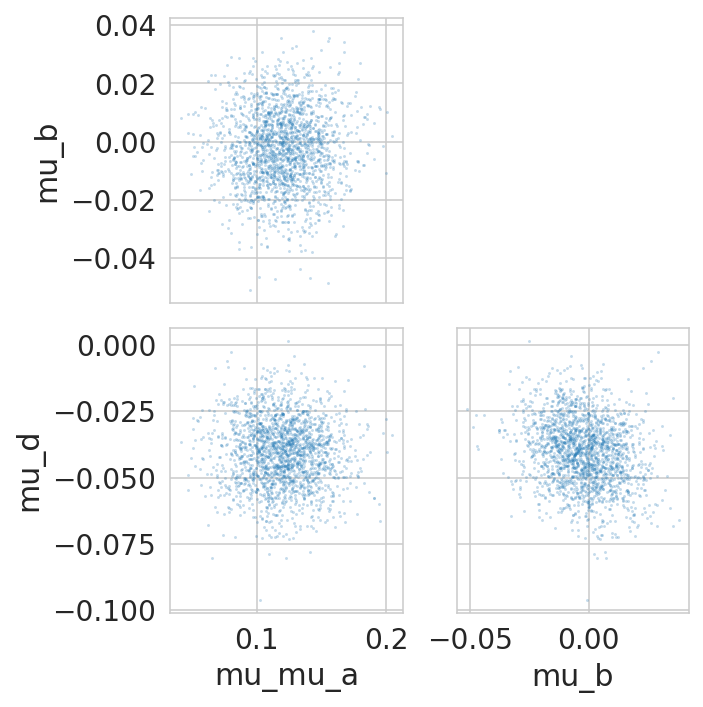

In [39]:
az.plot_pair(
    trace,
    var_names=["mu_mu_a", "mu_b", "mu_d"],
    scatter_kwargs={"alpha": 0.25, "markersize": 1},
    figsize=(5, 5),
)
plt.tight_layout()
plt.show()

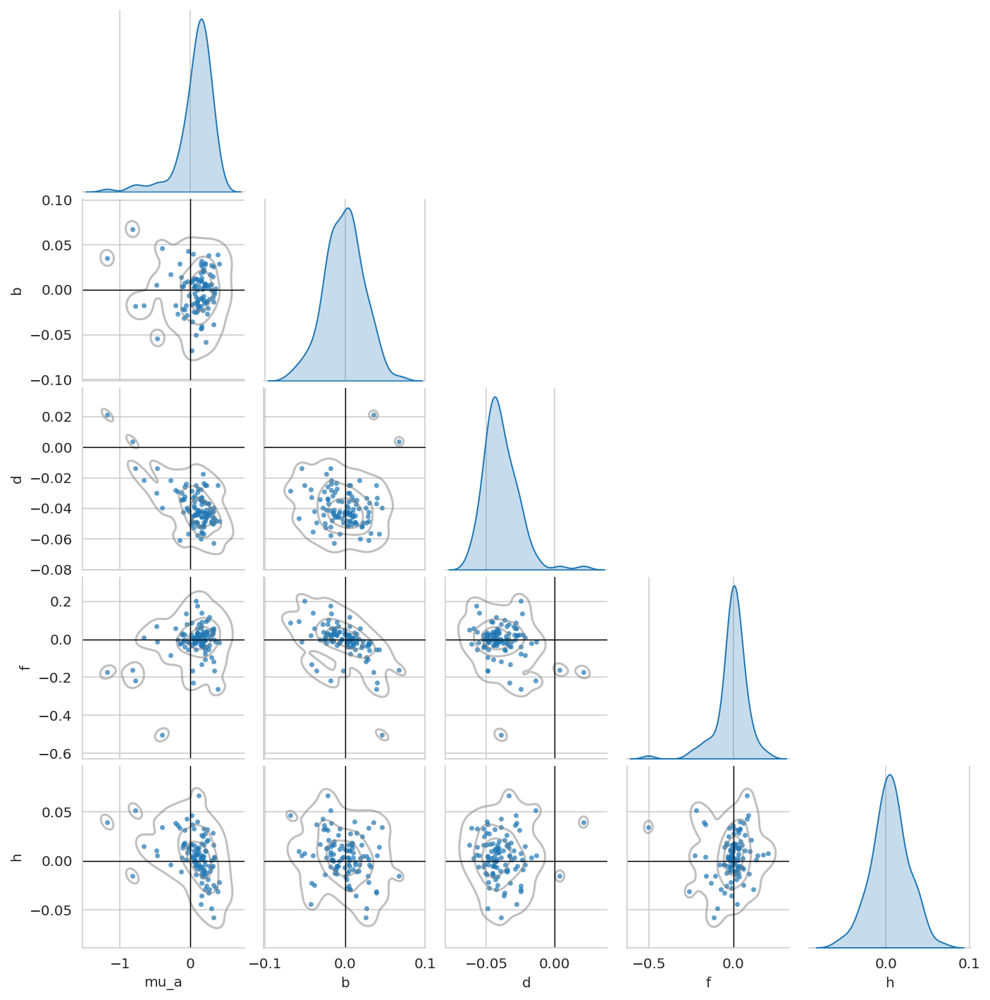

In [40]:
gene_effects = (
    trace.posterior.get(["mu_a", "b", "d", "f", "h"])
    .to_dataframe()
    .groupby(["gene"])
    .mean()
)
g = sns.pairplot(
    gene_effects,
    corner=True,
    diag_kind="kde",
    height=2,
    aspect=1,
    plot_kws={"edgecolor": None, "alpha": 0.7, "s": 10, "color": "tab:blue"},
)
g.map_lower(sns.kdeplot, levels=4, color="gray", alpha=0.5)
g.map_lower(lambda *args, **kwargs: plt.gca().axhline(color="k", linewidth=0.7))
g.map_lower(lambda *args, **kwargs: plt.gca().axvline(color="k", linewidth=0.7))
plt.show()

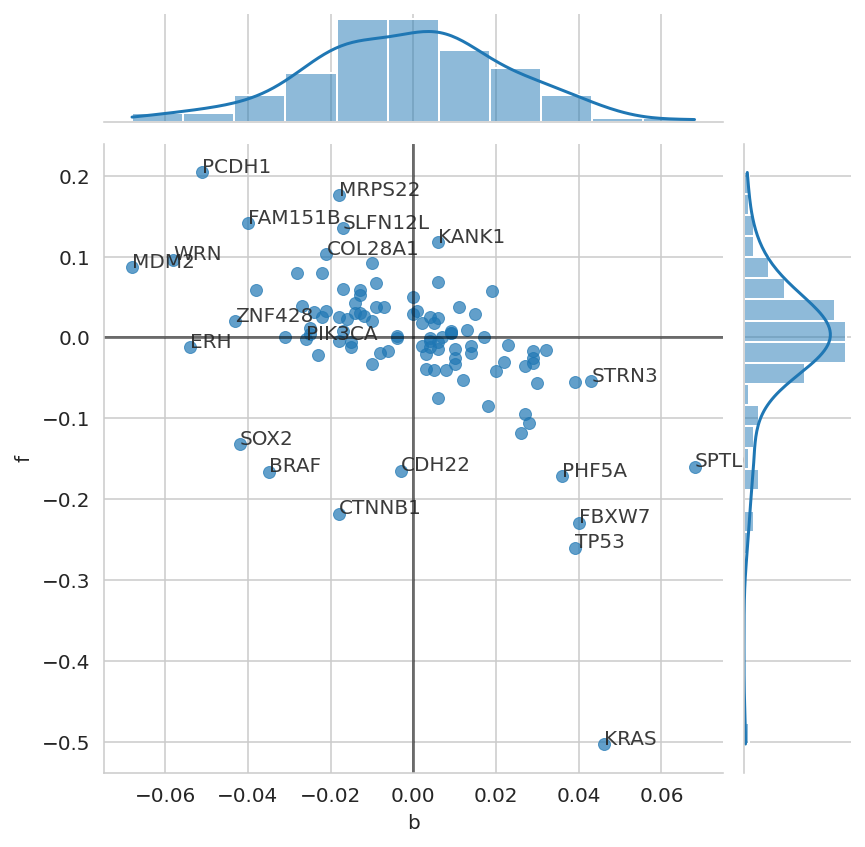

In [41]:
b_f_post = (
    az.summary(trace, var_names=["f", "b"])
    .pipe(extract_coords_param_names, names=["hugo_symbol"])
    .assign(var_name=lambda d: [x[0] for x in d.index.values])
    .pivot_wider("hugo_symbol", names_from="var_name", values_from="mean")
    .set_index("hugo_symbol")
)

jp = sns.jointplot(
    data=b_f_post,
    x="b",
    y="f",
    marginal_kws={"kde": True},
    joint_kws={"edgecolor": None, "alpha": 0.7},
)
ax = jp.ax_joint
ax.axhline(0, color="k", alpha=0.5)
ax.axvline(0, color="k", alpha=0.5)

genes_to_label = list(trace.posterior.coords["cancer_gene"].values)
genes_to_label += b_f_post[b_f_post["f"] < -0.15].index.tolist()
genes_to_label += b_f_post[b_f_post["f"] > 0.1].index.tolist()
genes_to_label += b_f_post[b_f_post["b"] < -0.04].index.tolist()
genes_to_label += b_f_post[b_f_post["b"] > 0.04].index.tolist()
genes_to_label = list(set(genes_to_label))
for gene in genes_to_label:
    data = b_f_post.query(f"hugo_symbol == '{gene}'")
    assert len(data) == 1
    ax.text(data["b"], data["f"], s=gene, alpha=0.9)


plt.show()

In [42]:
(
    valid_crc_data.filter_column_isin(
        "hugo_symbol", trace.posterior.coords["cancer_gene"].values
    )[["hugo_symbol", "depmap_id", "is_mutated"]]
    .drop_duplicates()
    .assign(is_mutated=lambda d: d["is_mutated"].map({True: "X", False: ""}))
    .pivot_wider("depmap_id", "hugo_symbol", "is_mutated")
    .set_index("depmap_id")
)

,KRAS,FBXW7,PIK3CA
depmap_id,,,
ACH-000253,,,
ACH-000286,X,,
ACH-000296,,,
ACH-000350,X,,
ACH-000470,X,X,
ACH-000958,,X,X
ACH-001786,,X,X
ACH-002024,X,,X


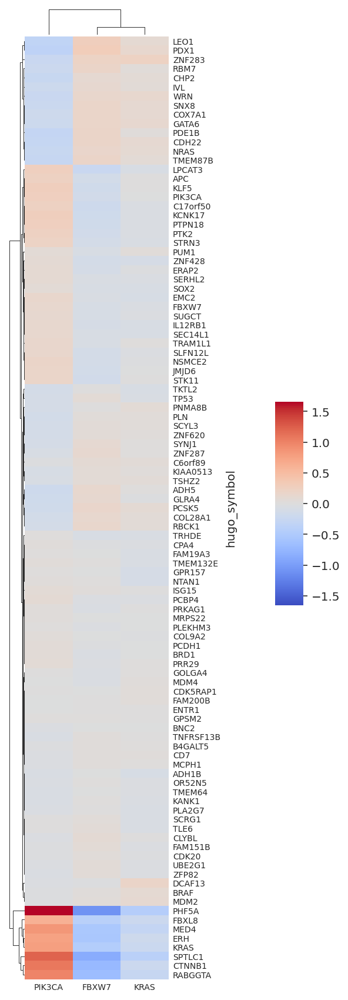

In [43]:
h_post_summary = (
    az.summary(trace, var_names="h", kind="stats")
    .pipe(extract_coords_param_names, names=["hugo_symbol", "cancer_gene"])
    .pivot_wider("hugo_symbol", names_from="cancer_gene", values_from="mean")
    .set_index("hugo_symbol")
)

vmax = np.abs(h_post_summary.values).max()

figsize = (3.3, 12)
dendro_ratio = (0.1, figsize[0] * 0.1 / figsize[1])
cm = sns.clustermap(
    h_post_summary,
    z_score=None,
    cmap="coolwarm",
    vmin=-vmax,
    vmax=vmax,
    figsize=figsize,
    dendrogram_ratio=dendro_ratio,
    cbar_pos=(1, 0.4, 0.1, 0.2),
    yticklabels=1,
)
cm.ax_heatmap.tick_params("both", labelsize=7, size=0)
plt.show()

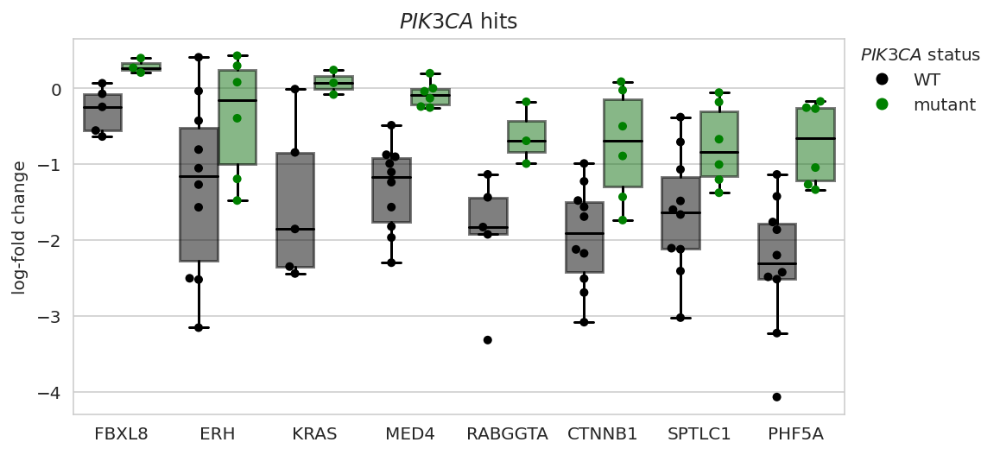

In [44]:
pik3ca_hits = h_post_summary.sort_values("PIK3CA").query("PIK3CA > 0.5").index.tolist()

pik3ca_mut_map = (
    crc_data.copy()
    .query("hugo_symbol == 'PIK3CA'")[["depmap_id", "is_mutated"]]
    .drop_duplicates()
    .reset_index(drop=True)
    .rename(columns={"is_mutated": "pik3ca_mut"})
)

pik3ca_hits_data = (
    crc_data.copy()
    .filter_column_isin("hugo_symbol", pik3ca_hits)
    .merge(pik3ca_mut_map, on="depmap_id")
    .reset_index(drop=True)
    .assign(
        hugo_symbol=lambda d: pd.Categorical(
            d["hugo_symbol"], categories=pik3ca_hits, ordered=True
        )
    )
)

pal = {
    False: "k",
    True: "g",
}

fig, ax = plt.subplots(figsize=(8, 4))
sns.boxplot(
    data=pik3ca_hits_data,
    x="hugo_symbol",
    y="lfc",
    hue="pik3ca_mut",
    palette=pal,
    dodge=True,
    ax=ax,
    flierprops={"markersize": 0},
    boxprops={"alpha": 0.5},
)
sns.swarmplot(
    data=pik3ca_hits_data,
    x="hugo_symbol",
    y="lfc",
    hue="pik3ca_mut",
    dodge=True,
    ax=ax,
    palette=pal,
)

ax.set_title("$\mathit{PIK3CA}$ hits")
ax.set_xlabel(None)
ax.set_ylabel("log-fold change")
ax.get_legend().remove()

leg_lbl = {True: "mutant", False: "WT"}
leg_handles = [
    Line2D([0], [0], linewidth=0, marker="o", color=v, label=leg_lbl[k])
    for k, v in pal.items()
]
ax.legend(
    handles=leg_handles,
    loc="upper left",
    bbox_to_anchor=(1, 1.02),
    title="$\mathit{PIK3CA}$ status",
    frameon=False,
)

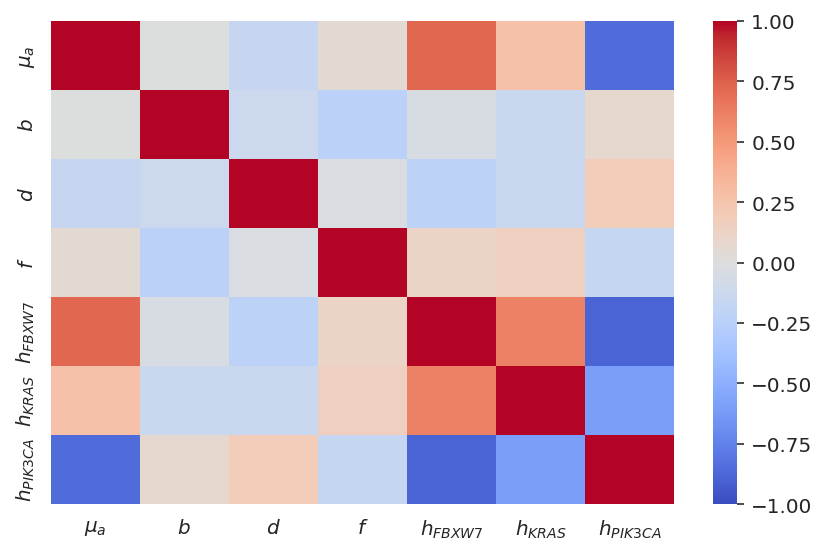

In [45]:
gene_vars = ["$\mu_a$", "$b$", "$d$", "$f$"]
gene_vars += ["$h_{" + g + "}$" for g in trace.posterior.coords["cancer_gene"].values]
gene_corr_post = (
    az.summary(trace, var_names=["genes_chol_cov_corr"], kind="stats")
    .pipe(extract_coords_param_names, names=["d0", "d1"])
    .astype({"d0": int, "d1": int})
    .assign(
        p0=lambda d: [gene_vars[i] for i in d["d0"]],
        p1=lambda d: [gene_vars[i] for i in d["d1"]],
    )
)

plot_df = gene_corr_post.pivot_wider(
    "p0", names_from="p1", values_from="mean"
).set_index("p0")
ax = sns.heatmap(plot_df, cmap="coolwarm", vmin=-1, vmax=1)
ax.set_xlabel(None)
ax.set_ylabel(None)
plt.tight_layout()
plt.show()

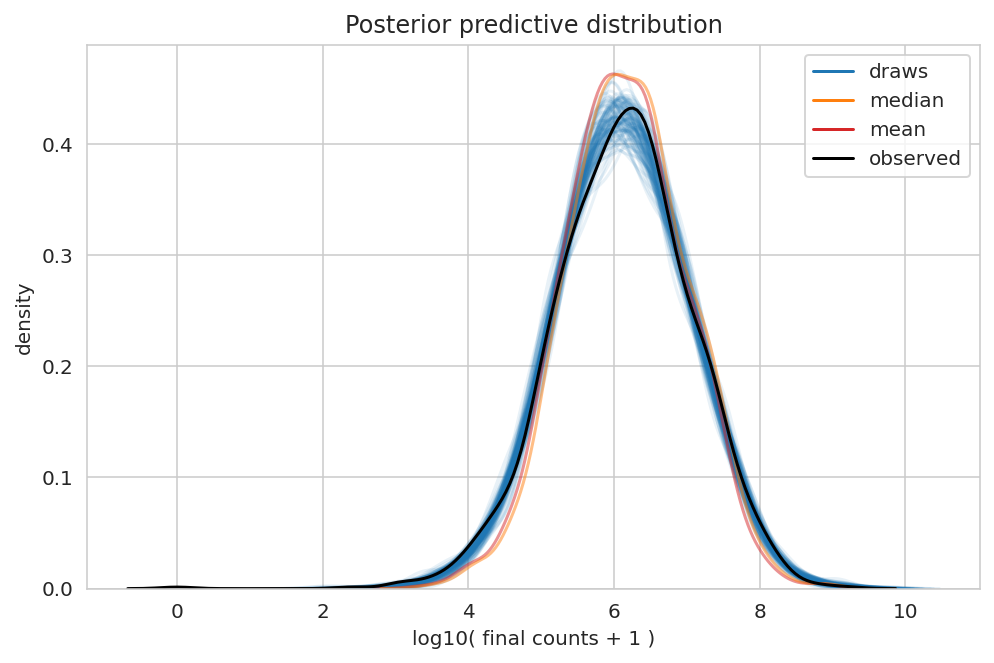

In [46]:
N = 100

pp_dist = trace.posterior_predictive["ct_final"]
n_chains, n_draws, n_samples = pp_dist.shape
draws_idx = np.random.choice(np.arange(n_draws), N // n_chains, replace=False)

fig, ax = plt.subplots(figsize=(8, 5))

ppc_pal = {
    "draws": "tab:blue",
    "median": "tab:orange",
    "mean": "tab:red",
    "observed": "black",
}

# Example draws.
for c, d in product(range(n_chains), draws_idx):
    values = np.log(pp_dist[c, d, :].values + 1)
    sns.kdeplot(values, color=ppc_pal["draws"], alpha=0.1, ax=ax)

# Average distributions.
pp_dist_mean = np.log(pp_dist.median(axis=(0, 1)) + 1)
pp_dist_mid = np.log(pp_dist.mean(axis=(0, 1)) + 1)
sns.kdeplot(pp_dist_mean, color=ppc_pal["mean"], ax=ax, alpha=0.5)
sns.kdeplot(pp_dist_mid, color=ppc_pal["median"], ax=ax, alpha=0.5)

# Observed distribution.
sns.kdeplot(
    np.log(trace.observed_data["ct_final"] + 1), ax=ax, color=ppc_pal["observed"]
)

ppc_leg_handles: list[Line2D] = []
for lbl, color in ppc_pal.items():
    ppc_leg_handles.append(Line2D([0], [0], color=color, label=lbl))

plt.legend(handles=ppc_leg_handles, loc="best")


ax.set_xlabel("log10( final counts + 1 )")
ax.set_ylabel("density")
ax.set_title("Posterior predictive distribution")
plt.show()

In [47]:
# az.plot_forest(trace, var_names=["b", "f"], combined=True)
# plt.show()

---

In [48]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 6.85 minutes


In [49]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-07-29

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 3.10.0-1160.71.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 28
Architecture: 64bit

Hostname: compute-e-16-235.o2.rc.hms.harvard.edu

Git branch: simplify

matplotlib: 3.5.2
plotnine  : 0.0.0
numpy     : 1.22.4
pymc      : 4.1.2
seaborn   : 0.11.2
aesara    : 2.7.5
arviz     : 0.12.1
pandas    : 1.4.3

